# Librosa trial

[Librosa tutorial](https://github.com/librosa/tutorial)

Librosa requires a few additional packages to load audio data encoded in various formats (e.g., mp3, ogg, flac, m4a). The two main libraries used by librosa are ffmpeg and gstreamer. Both are optional, but you must install at least one package. Audio codec libraries are packaged differently on different platforms.

```bash
sudo apt install libcairo2-dev
sudo apt install libgirepository1.0-dev
sudo apt install ffmpeg
poetry add pygobject
```


In [1]:
import librosa
import librosa.display
import IPython
import numpy as np
import matplotlib.pyplot as plt
import sys
import os
from sklearn.preprocessing import minmax_scale
sys.path.insert(0, os.path.abspath('..'))
from dataprocess.cwt.scalogram import plot_data, plot_peaks
from dataprocess.cwt.cwt2 import rd_file
from dataprocess.sound.preprocess import retrieve_clips

In [2]:

SOUND_FOLDER = '../data/sound/grasshopper-sound-4'


In [3]:

fn = f'{SOUND_FOLDER}/gh-4_mono_44k_denoised.wav'
y, sr, dura = rd_file(fn, sr=44100)
print(f'data shape: {y.shape}, data:\n{y[:20]}')
print(f'sample rate: {sr}')
print(f'duration: {dura}')


data shape: (456434,), data:
[0.06838799 0.06838799 0.06838799 0.06838799 0.06838799 0.06838799
 0.06838799 0.06838799 0.06838799 0.06838799 0.06838799 0.06838799
 0.06838799 0.06838799 0.06838799 0.06838799 0.06838799 0.06838799
 0.06838799 0.06838799]
sample rate: 44100
duration: 10.349977324263039


In [4]:

IPython.display.display(IPython.display.Audio(data=y, rate=sr))
# IPython.display.Audio(data=y, rate=sr)
print('hello')

hello


## Split into sub sound track

In [5]:

slices_gen = librosa.stream(fn, block_length=1, frame_length=sr*4,
    hop_length=int(sr*3), mono=True, fill_value=0)

mean = y.mean()

def ms(data, mean):
    data = minmax_scale(data-mean, feature_range=(-1,1))
    return data

# tmp = [i for i in slices_gen]
# print(f'tmp[0]: {tmp[0][:20]}')

slices = [ms(i, mean) for i in slices_gen]
print(f'slices[0]: {slices[0][:20]}')

for i in slices:
    IPython.display.display(IPython.display.Audio(data=i, rate=sr))

slices[0]: [-0.04196936 -0.04196936 -0.04196936 -0.04196936 -0.04196936 -0.04196936
 -0.04196936 -0.04196936 -0.04196936 -0.04196936 -0.04196936 -0.04196936
 -0.04196936 -0.04196936 -0.04196936 -0.04196936 -0.04196936 -0.04196936
 -0.04196936 -0.04196936]


## stretch

In [6]:
t_fn = '../zjw/gh-4_mono_44k_denoised_0.wav'
# first_slice = slices[0]
first_slice, _, _ = rd_file(t_fn, sr=sr)
IPython.display.display(IPython.display.Audio(data=first_slice, rate=sr))

# make it faster
faster = librosa.effects.time_stretch(first_slice, rate=1.2)
IPython.display.display(IPython.display.Audio(data=faster, rate=sr))

slower = librosa.effects.time_stretch(first_slice, rate=0.8)
IPython.display.display(IPython.display.Audio(data=slower, rate=sr))

# pick peaks

### number count peak

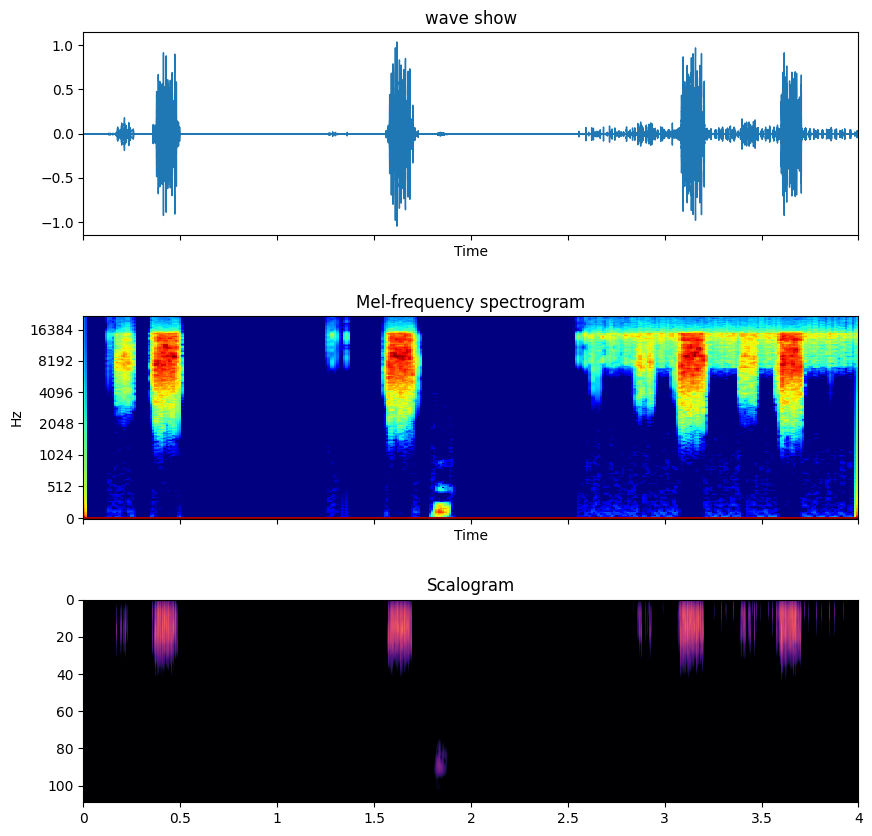

In [7]:
fig3 = plot_data(first_slice, sr=sr, type='all', threshold=-60)

## Audio Onset Detection: Data preparation for a baseball application using Librosa

https://towardsdatascience.com/audio-onset-detection-data-preparation-for-a-baseball-application-using-librosa-7f9735430c17

https://blog.paperspace.com/audio-analysis-processing-maching-learning/

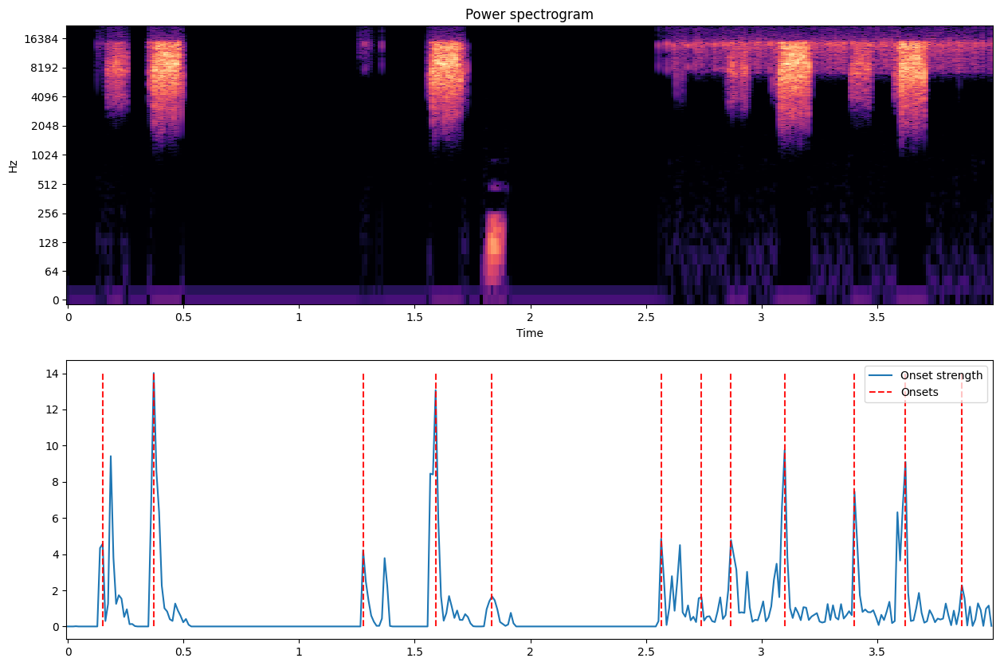

In [8]:
onset_env_nc = librosa.onset.onset_strength(y=first_slice, sr=sr,
    # hop_length=1024,
    # aggregate=np.median
)
#print(f'number count onset_env len {len(onset_env_nc)}:\n{onset_env_nc}')

# onset_nc = librosa.onset.onset_detect(y=slices[0], sr=sr2, units='time')
# print(f'number count onset detect len {len(onset_nc)}:\n{onset_nc}')

peaks_nc = librosa.util.peak_pick(onset_env_nc, pre_max=3, post_max=3, 
    pre_avg=3, post_avg=5, delta=0.8, wait=10)

    
fig = plot_peaks(y=first_slice, onset=onset_env_nc, peaks=peaks_nc, sr=sr)

### retrieve sub sound clips

In [9]:
clips = retrieve_clips(fn=t_fn, sr=sr, peaks=peaks_nc, forth=2.0)
for c in clips:
    IPython.display.display(IPython.display.Audio(data=c, rate=sr))
    

/home/zhangjw/work/github/python/PestDataprocess/dataprocess/sound/preprocess.py:96: FutureWarning: Pass y=[0. 0. 0. ... 0. 0. 0.], sr=44100 as keyword args. From version 0.10 passing these as positional arguments will result in an error
  t_dura = librosa.get_duration(sub_1, sr)


## pick peaks by scipy.signal

In [ ]:
# prom = 0.3, peakdur = 0.3
# peaks, _ = find_peaks(v, prominence=prom) 
# m = mask_sig(len(v), peaks, sr=sr, dur=peakdur) # create signal mask


## identify silence

In [15]:
intervals = librosa.effects.split(y, top_db=8)
print(f'intervals shape: {intervals.shape}, content:\n{intervals}')

intervals shape: (11, 2), content:
[[ 15872  22528]
 [ 68608  75264]
 [135168 142336]
 [158208 164352]
 [199680 206336]
 [263680 270336]
 [284672 291328]
 [331776 333312]
 [353792 361472]
 [433664 441344]
 [444928 448000]]


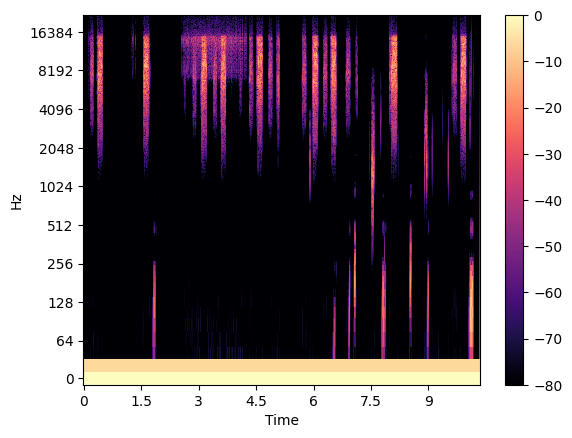

In [16]:
# And compute the spectrogram magnitude and phase
S_full, phase = librosa.magphase(librosa.stft(y))


###################
# Plot the spectrum
fig, ax = plt.subplots()
img = librosa.display.specshow(librosa.amplitude_to_db(S_full, ref=np.max),
                               y_axis='log', x_axis='time', sr=sr, ax=ax)
fig.colorbar(img, ax=ax);

rms shape: (892,)
times len: 892, times:
[0.         0.02321995 0.04643991 0.06965986 0.09287982 0.11609977
 0.13931973 0.16253968 0.18575964 0.20897959]
[20.48       20.50321995 20.52643991 20.54965986 20.57287982 20.59609977
 20.61931973 20.64253968 20.66575964 20.68897959]


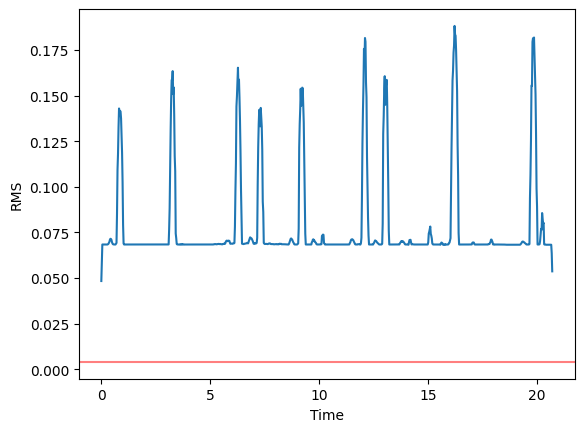

In [17]:
# As a first step, we can plot the root-mean-square (RMS) curve
rms = librosa.feature.rms(y=y)[0]
print(f'rms shape: {rms.shape}')
times = librosa.frames_to_time(np.arange(len(rms)))
print(f'times len: {len(times)}, times:\n{times[:10]}\n{times[-10:]}')

fig, ax = plt.subplots()
ax.plot(times, rms)
cut_line = 0.004
ax.axhline(cut_line, color='r', alpha=0.5)
ax.set(xlabel='Time', ylabel='RMS');


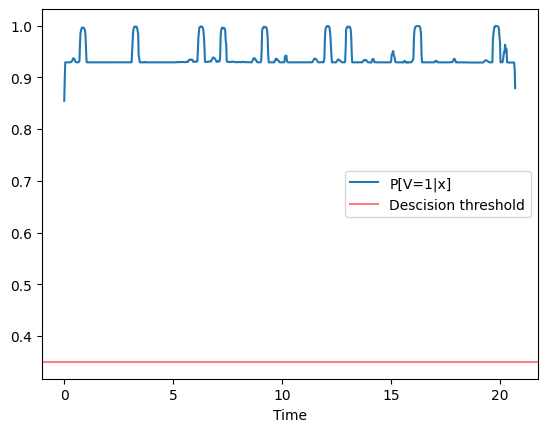

In [18]:
r_normalized = (rms - cut_line) / np.std(rms)
p = np.exp(r_normalized) / (1 + np.exp(r_normalized))

fig, ax = plt.subplots()
ax.plot(times, p, label='P[V=1|x]')
ax.axhline(0.35, color='r', alpha=0.5, label='Descision threshold')
ax.set(xlabel='Time')
ax.legend()

<Figure size 1200x600 with 0 Axes>

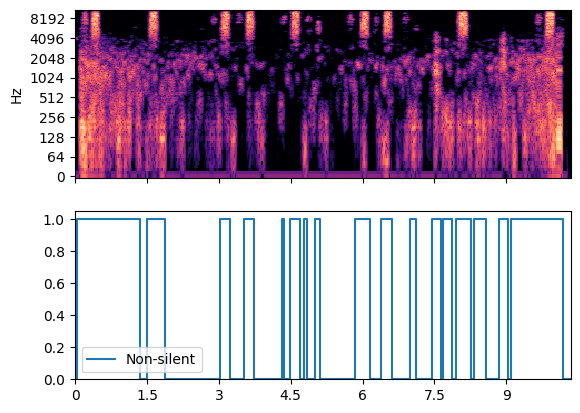

In [25]:
plt.figure(figsize=(12, 6))
fig, ax = plt.subplots(nrows=2, sharex=True)
librosa.display.specshow(librosa.amplitude_to_db(S_full, ref=np.max),
                         y_axis='log', x_axis='time', sr=sr, ax=ax[0])
ax[0].label_outer()
ax[1].step(times, p>=0.35, label='Non-silent')
ax[1].set(ylim=[0, 1.05])
ax[1].legend()

In [5]:
# 3. Run the default beat tracker
tempo, beat_frames = librosa.beat.beat_track(y=y, sr=sr)

print('Estimated tempo: {:.2f} beats per minute'.format(tempo))

# 4. Convert the frame indices of beat events into timestamps
beat_times = librosa.frames_to_time(beat_frames, sr=sr)
print(beat_frames)

Estimated tempo: 123.05 beats per minute
[  5  27  48  69  90 112 134 156 176 197 218 239 259 279 301 324 345 365]


In [6]:
# 1. Get the file path to an included audio example
filename = librosa.example('nutcracker')


# 2. Load the audio as a waveform `y`
#    Store the sampling rate as `sr`
y, sr = librosa.load(filename)
IPython.display.Audio(data=y, rate=sr)

In [7]:

# 3. Run the default beat tracker
tempo, beat_frames = librosa.beat.beat_track(y=y, sr=sr)

print('Estimated tempo: {:.2f} beats per minute'.format(tempo))

# 4. Convert the frame indices of beat events into timestamps
beat_times = librosa.frames_to_time(beat_frames, sr=sr)

Estimated tempo: 107.67 beats per minute
